In [1]:
! pip install Scikit-learn
!pip install scikit-image

In [2]:
from skimage.io import imread
from skimage import io,color
image=imread("mountains.jpg")
print(type(image))

<class 'numpy.ndarray'>


In [3]:
image.shape

(297, 472, 3)

In [4]:
image.size

420552

In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.express as px

In [6]:
import numpy as np
def show(image: np.ndarray, title="Image", cmap_type="gray", axis=False):

    """

    A function to display np.ndarrays as images

    """

    plt.imshow(image, cmap=cmap_type)

    plt.title(title)

    if not axis:

        plt.axis("off")

    plt.margins(0, 0)

    plt.show()

In [7]:
def compare(

    original,

    filtered,

    title_filtered="Filtered",

    cmap_type="gray",

    axis=False,

    title_original="Original",

):

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8), sharex=True, sharey=True)

 

    ax1.imshow(original, cmap=cmap_type)

    ax1.set_title(title_original)

 

    ax2.imshow(filtered, cmap=cmap_type)

    ax2.set_title(title_filtered)

 

    if not axis:

        ax1.axis("off")

        ax2.axis("off")

    plt.subplots_adjust(top=1, bottom=0, right=1, left=0, hspace=0, wspace=0.01)

    plt.margins(0, 0)

    plt.show()

In [8]:
red=image[:,:,0]
print(red)

[[ 55  55  55 ... 193 199 210]
 [ 55  55  55 ... 188 197 210]
 [ 55  55  55 ... 190 197 206]
 ...
 [ 81  84  88 ...  78  71  71]
 [122 112 112 ... 132 134 135]
 [115 112 112 ... 137 137 133]]


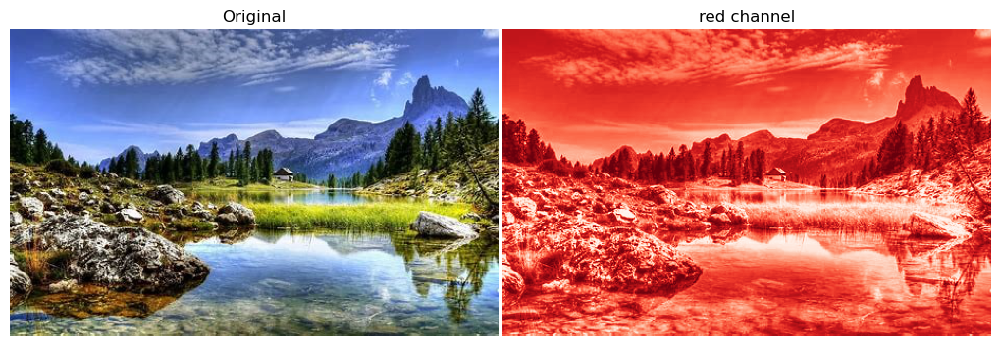

In [9]:
compare(image,red,"red channel",cmap_type='Reds_r')

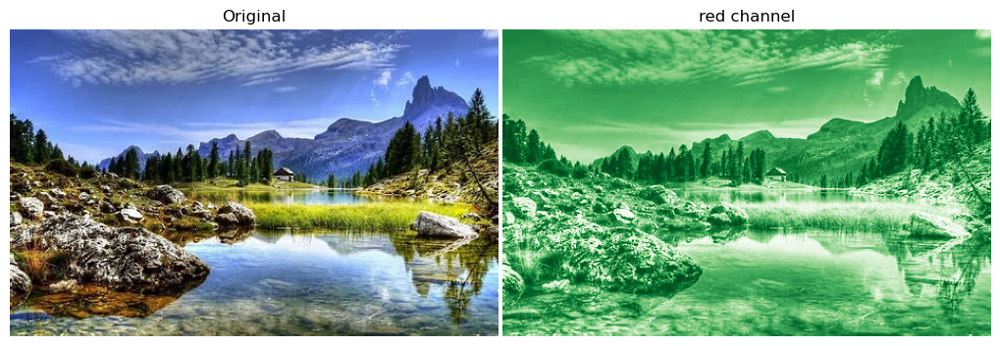

In [10]:
red=image[:,:,0]
compare(image,red,"red channel",cmap_type='Greens_r')

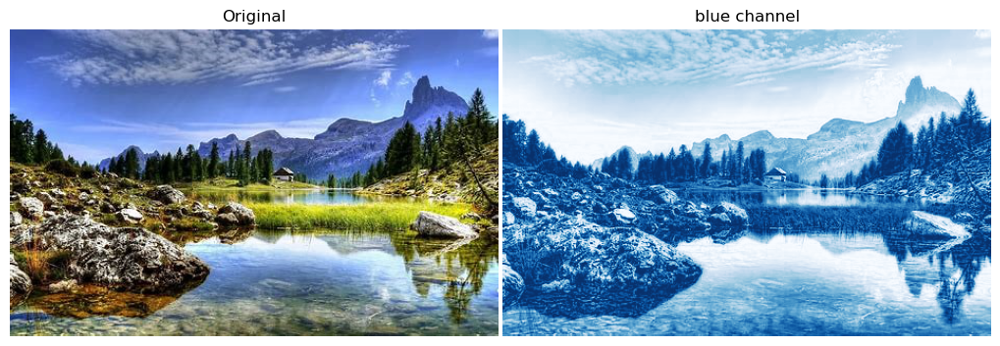

In [11]:
red=image[:,:,2]
compare(image,red,"blue channel",cmap_type='Blues_r')

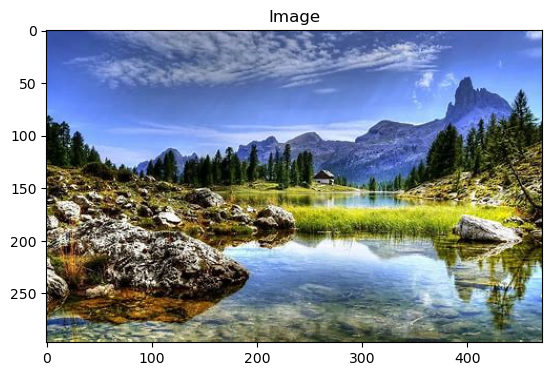

In [12]:
show(image,axis=True)

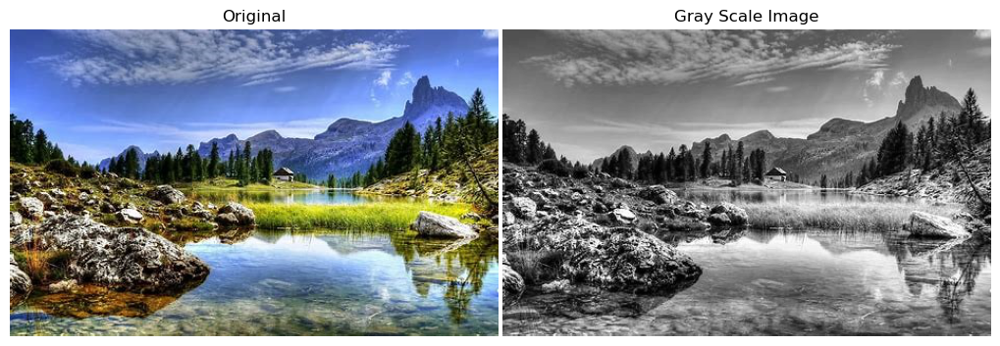

In [13]:
from skimage.color import rgb2gray
gray=rgb2gray(image)
compare(image,gray,'Gray Scale Image')

In [14]:
gray.ndim

2

In [15]:
gray.size

140184

In [16]:
gray.shape

(297, 472)

In [17]:
kitten=imread("kitty.jpg")

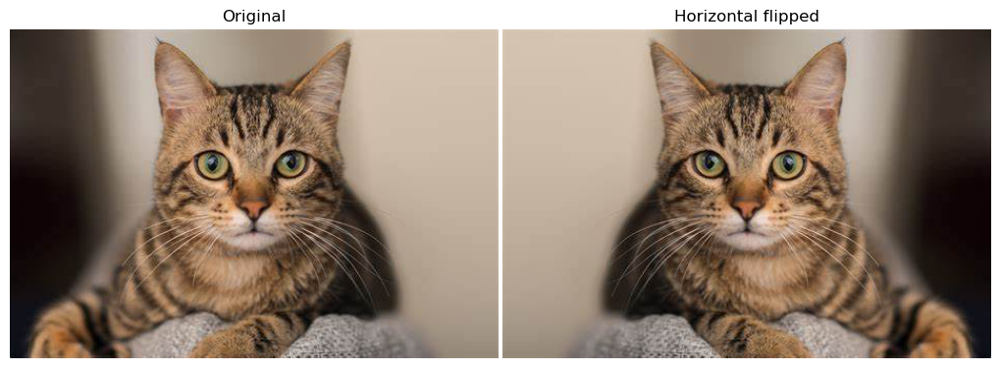

In [18]:
horizontal_flipp=np.fliplr(kitten)
compare(kitten,horizontal_flipp,"Horizontal flipped") 

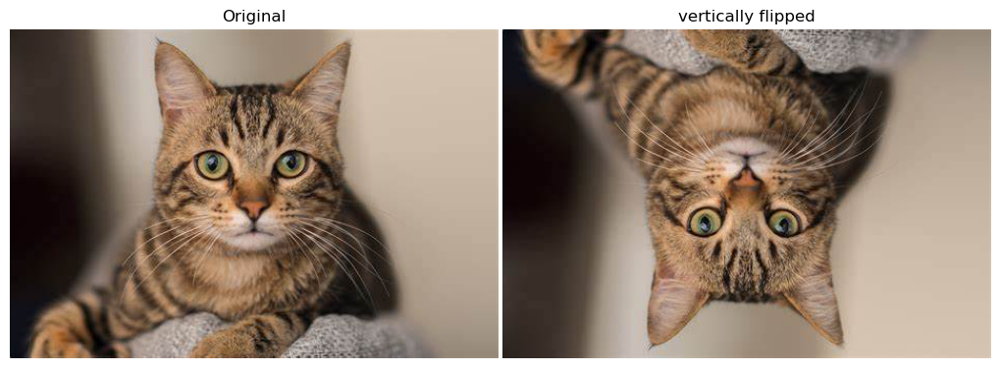

In [19]:
horizontal_flipp=np.flipud(kitten)
compare(kitten,horizontal_flipp,"vertically flipped")

In [20]:
def plot_with_hist_channel(image, channel):

    channels = ["red", "green", "blue"]

    channel_idx = channels.index(channel)

    color = channels[channel_idx]

 

    extracted_channel = image[:, :, channel_idx]

    fig, (ax1, ax2) = plt.subplots(

        ncols=2, figsize=(18, 6)

    )  # , sharex=True, sharey=True)

 

    ax1.imshow(image)

    ax1.axis("off")

    ax2.hist(extracted_channel.ravel(), bins=256, color=color)

    ax2.set_title(f"{channels[channel_idx]} histogram")

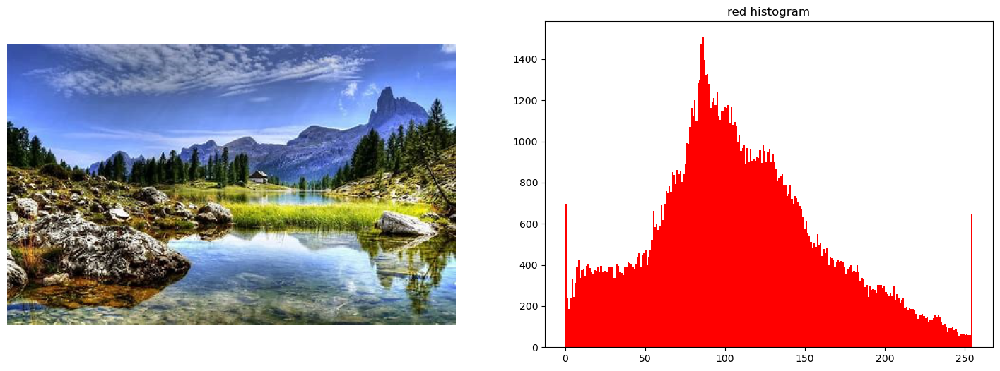

In [21]:
plot_with_hist_channel(image,'red')

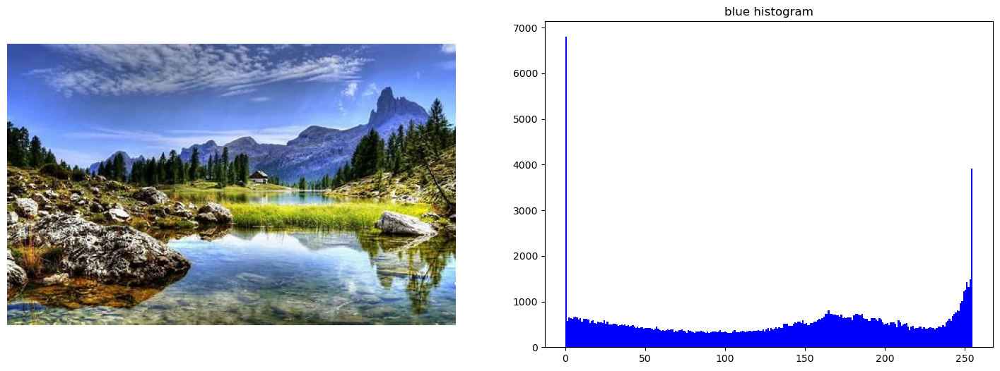

In [22]:
plot_with_hist_channel(image,'blue')

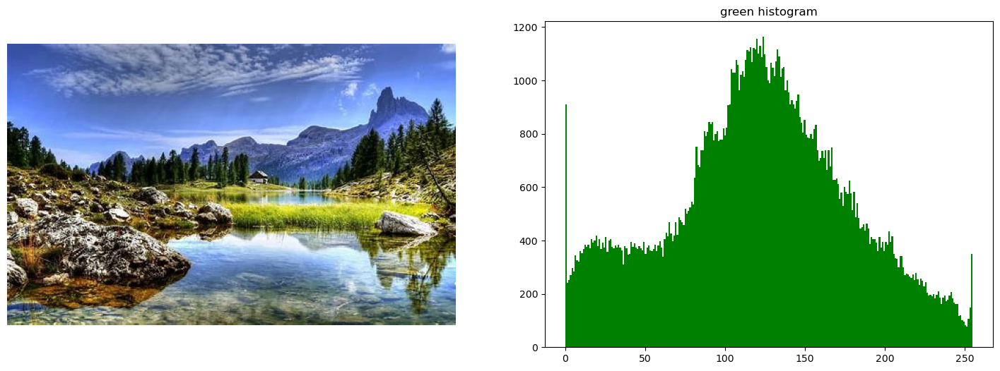

In [23]:
plot_with_hist_channel(image,'green')

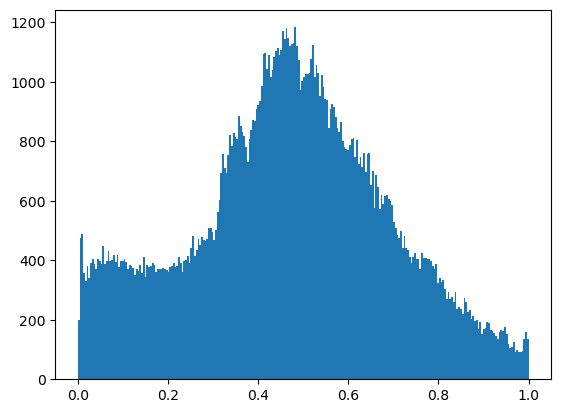

In [24]:
plt.hist(gray.ravel(),bins=256)
plt.show()

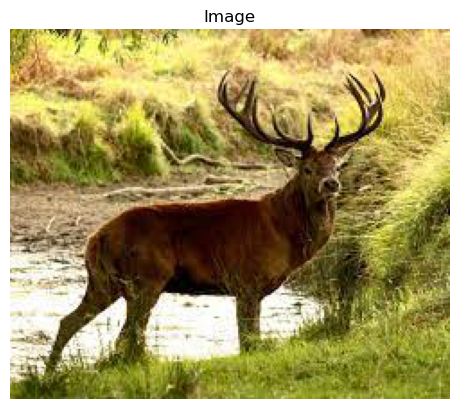

In [25]:
stag=imread("deer.jpg")
show(stag)

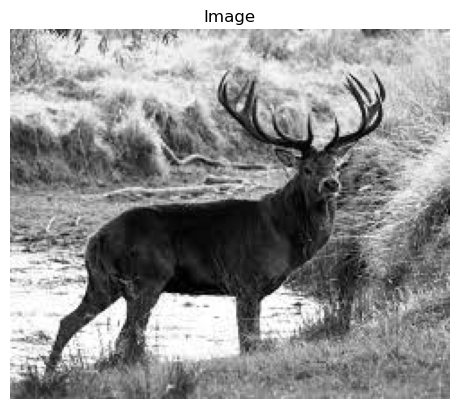

In [26]:
stag_gray=rgb2gray(stag)
show(stag_gray)

In [27]:
stag_gray.mean()

0.544819065264941

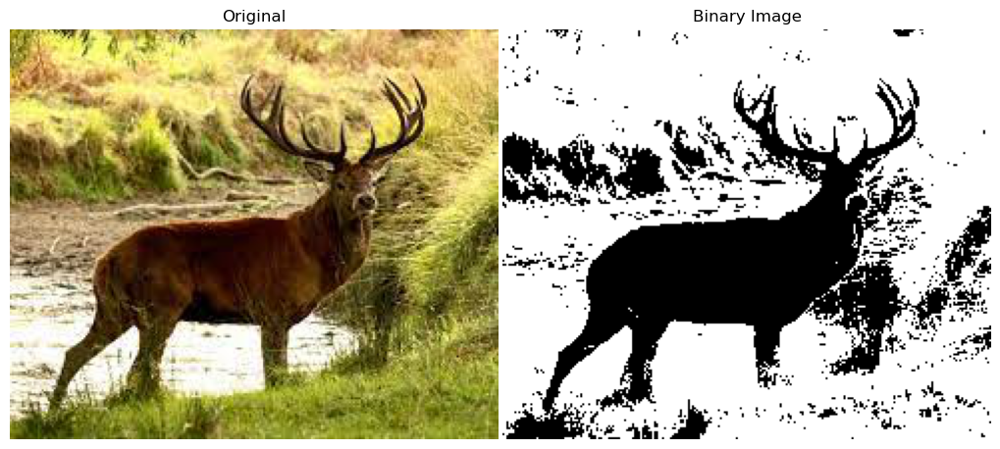

In [28]:
threshold=0.40
binary_image=stag_gray>threshold
compare(stag,binary_image,'Binary Image')

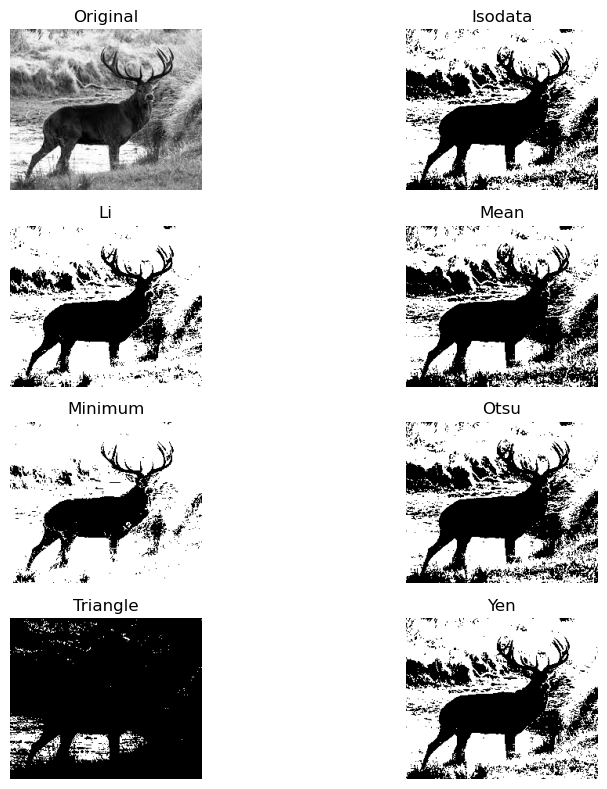

In [29]:
from skimage.filters import try_all_threshold
fig,ax=try_all_threshold(stag_gray,figsize=(10,8),verbose=False)

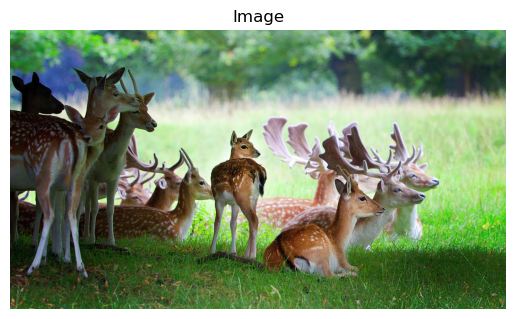

In [30]:
stag=imread("deers.jpg")
show(stag)

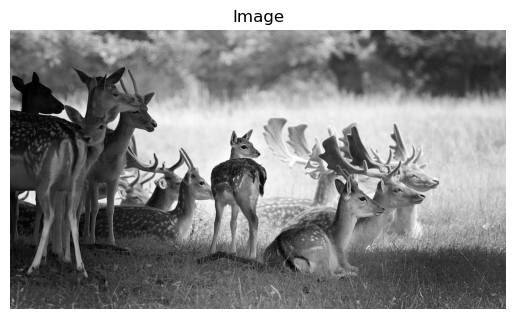

In [31]:
stag_gray=rgb2gray(stag)
show(stag_gray)

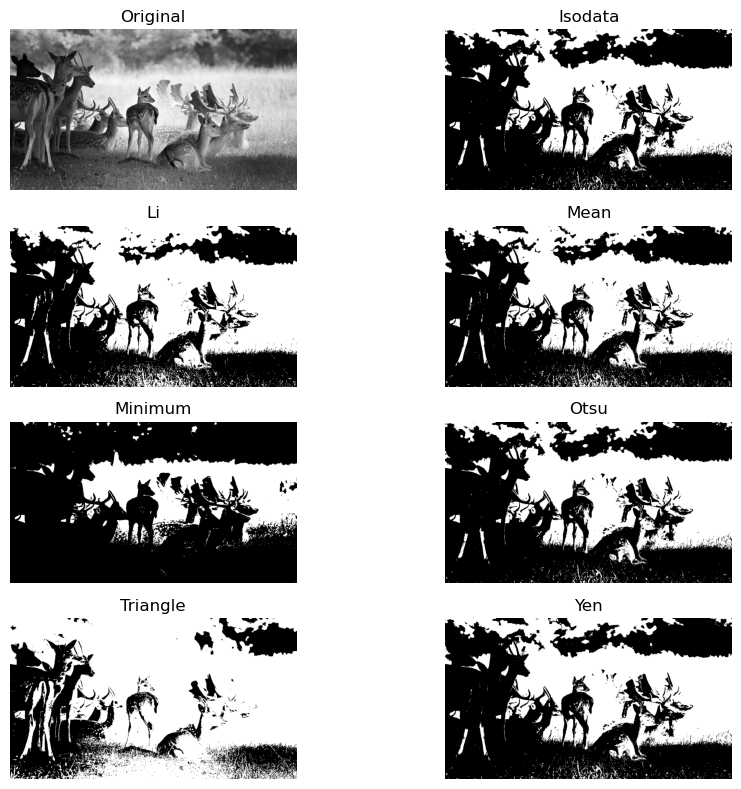

In [32]:
from skimage.filters import try_all_threshold
fig,ax=try_all_threshold(stag_gray,figsize=(10,8),verbose=False)

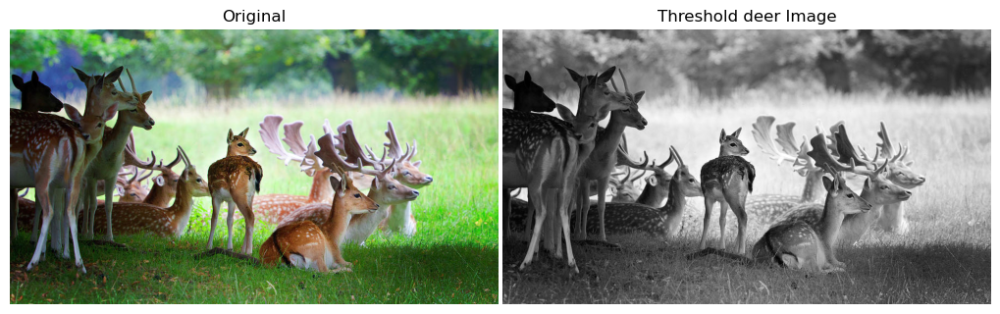

In [33]:
from skimage.filters import threshold_local
local_thresh=threshold_local(stag_gray,block_size=3,offset=0.0002)
binary_flower=stag_gray>local_thresh
compare(stag,stag_gray,"Threshold deer Image")

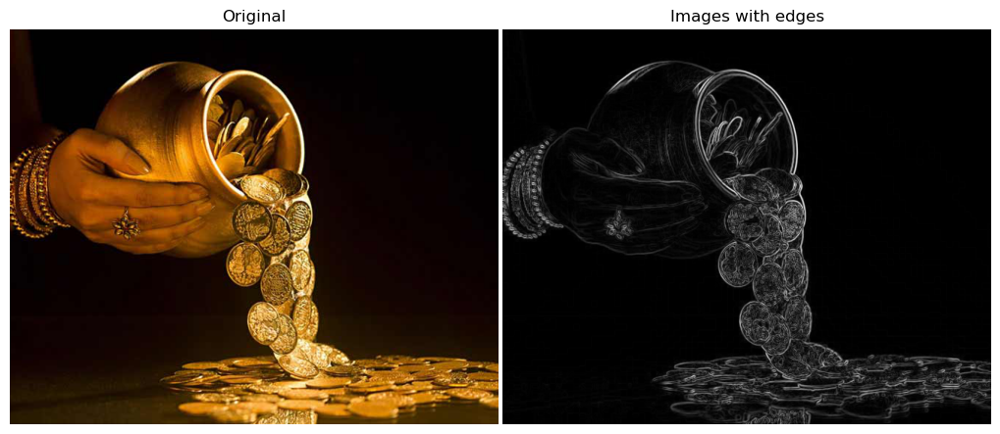

In [34]:
from skimage.filters import sobel
coins=imread("coins.jpg")
coins_gray=rgb2gray(coins)
coins_edge=sobel(coins_gray)
compare(coins,coins_edge,"Images with edges")

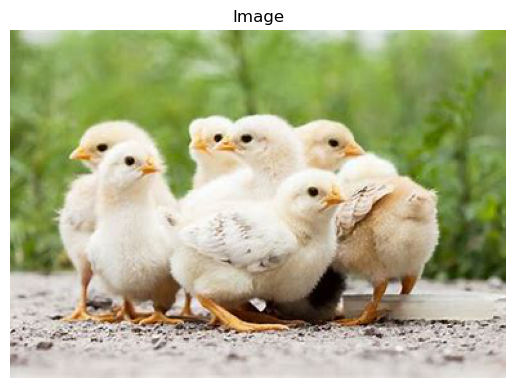

In [35]:
chick=imread("chick.jpg")
show(chick)

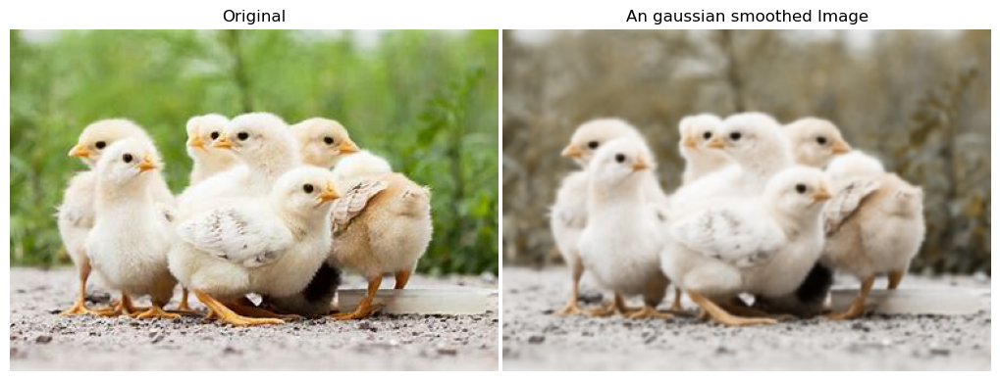

In [36]:
from skimage.filters import gaussian
smoothed=gaussian(chick,sigma=1)
compare(chick,smoothed,'An gaussian smoothed Image')

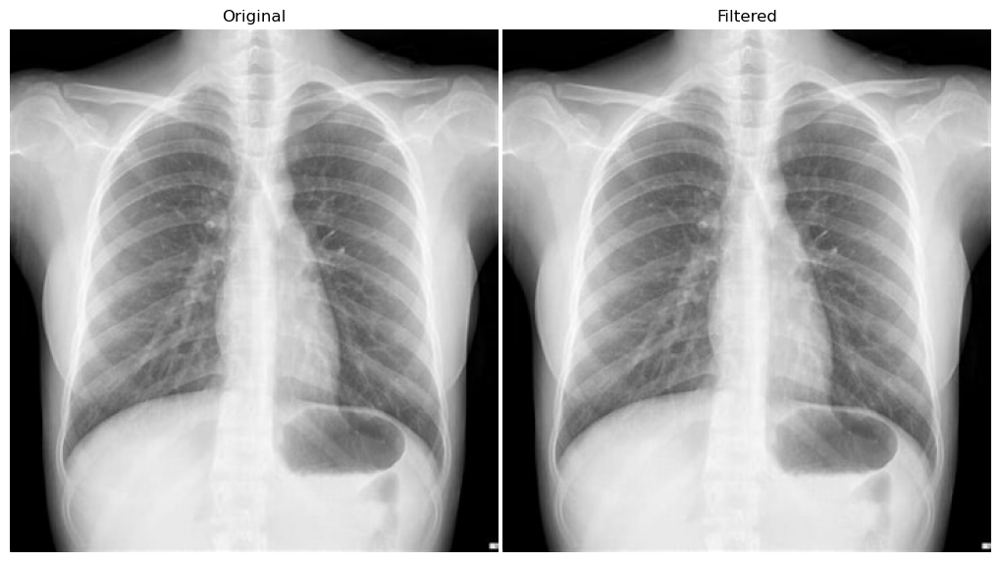

In [37]:
xray=imread("x ray.jpg")

xray_gray=rgb2gray(xray)
compare(xray,xray_gray)

In [38]:
xray.min()

0

In [39]:
xray.max()-xray.min()

255

C:\Users\KATHIR\anaconda3\envs\myenv\Lib\site-packages\skimage\_shared\utils.py:316: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


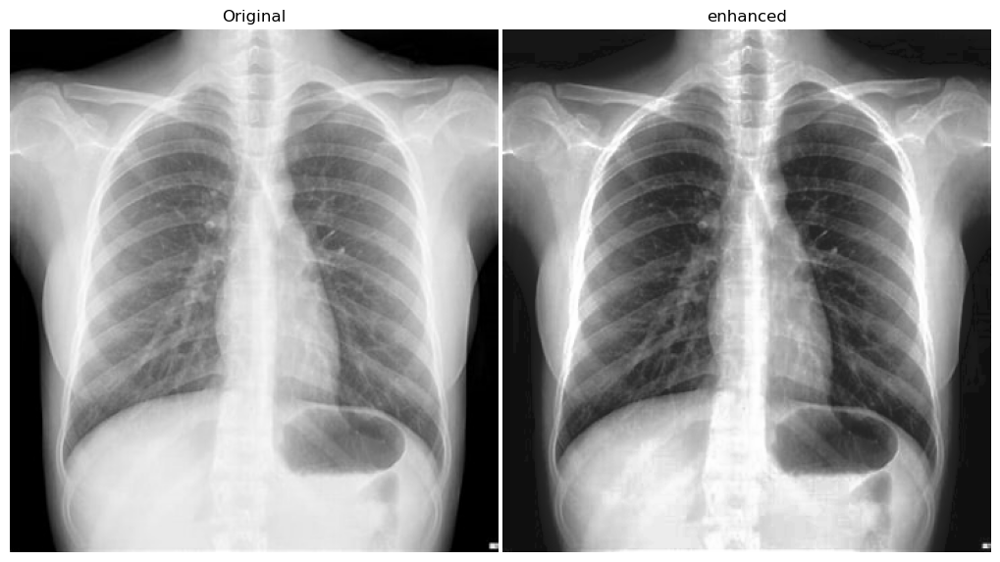

In [40]:
from skimage.exposure import equalize_hist
enhanced=equalize_hist(xray)
compare(xray,enhanced,"enhanced")

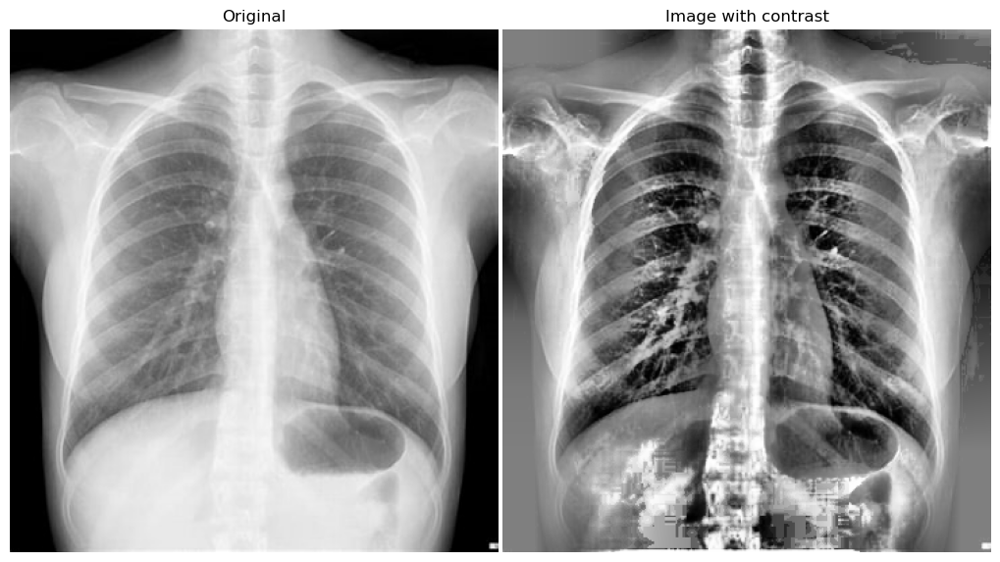

In [41]:
from skimage.exposure import equalize_adapthist
equalize_adapthist=equalize_adapthist(xray,clip_limit=0.5)
compare(xray,equalize_adapthist,"Image with contrast")

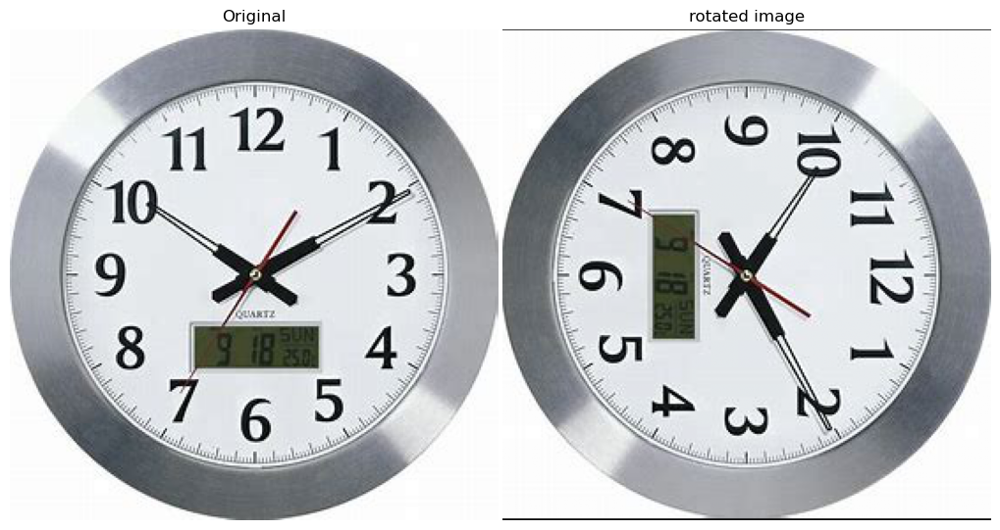

In [42]:
from skimage.transform import rotate
clock=imread("clock.jpg")
clockwise=rotate(clock,angle=-90)
compare(clock,clockwise,'rotated image')

In [43]:
butter=imread("Butterfly.jpg")
butter.shape

(799, 1000, 3)

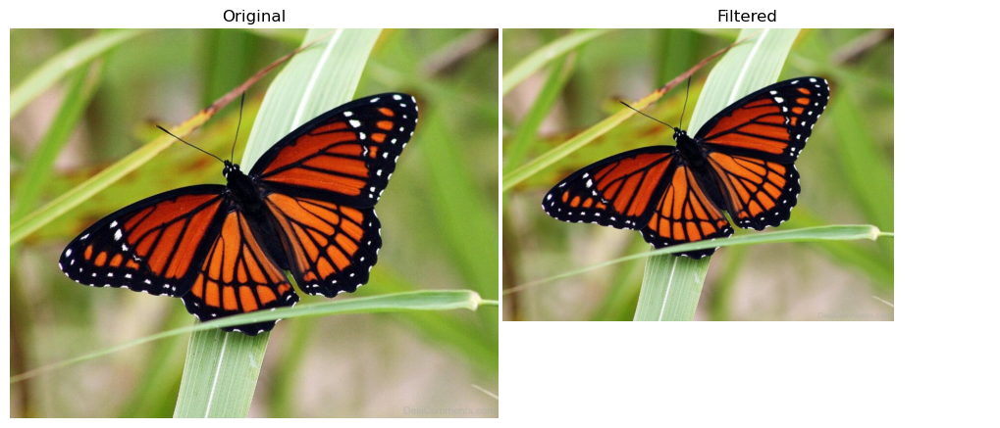

In [44]:
from skimage.transform import resize
resize_butter=resize(butter,output_shape=(600,800))
compare(butter,resize_butter)



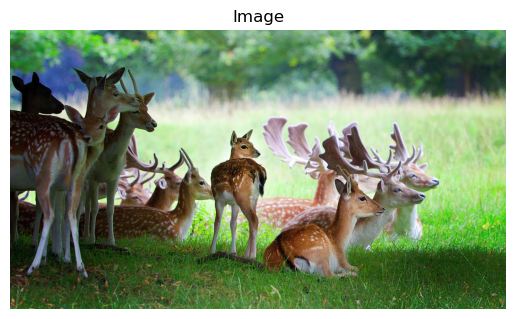

In [45]:
show(stag)

In [46]:
stag.shape

(506, 900, 3)

In [47]:
def make_mask(image):
    mask=np.zeros(image.shape[:-1])
    mask[250:300,100:150]=1
    mask[50:100,300:433]=1
    mask[300:380,800:850]=1
    mask[200:270,750:800]=1
    return mask.astype(bool)

In [48]:
mask=make_mask(stag)
image_defect=stag*~mask[...,np.newaxis]

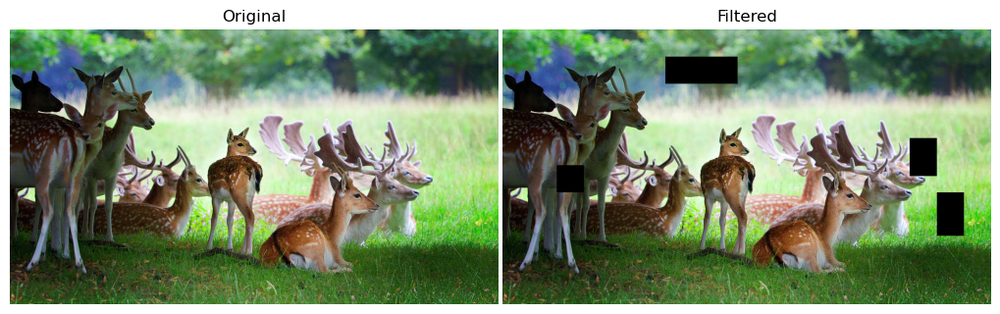

In [49]:
compare(stag,image_defect)

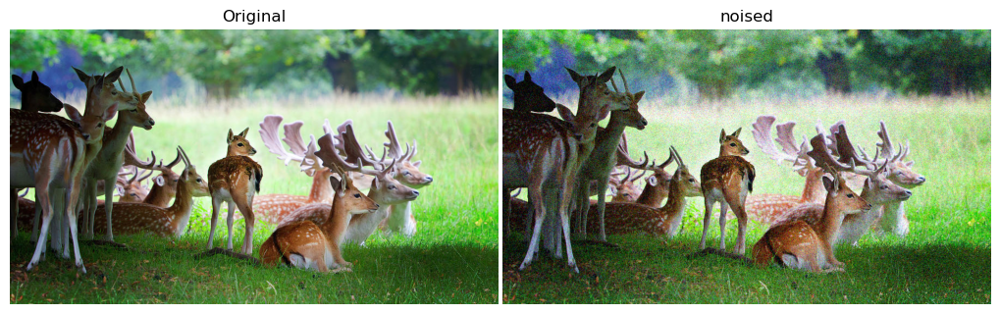

In [50]:
from skimage.util import random_noise
noisy_deer=random_noise(stag)
compare(stag,noisy_deer,"noised")

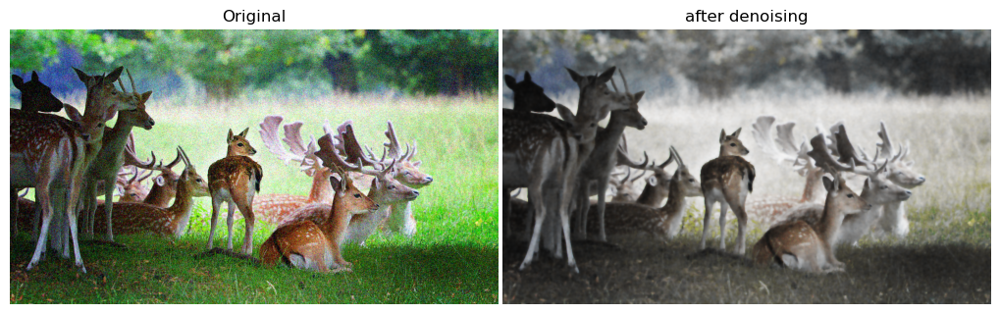

In [51]:
from skimage.restoration import denoise_tv_chambolle
denoised_deer=denoise_tv_chambolle(noisy_deer,weight=0.2)
compare(noisy_deer,denoised_deer,"after denoising")

In [52]:
from skimage.measure import find_contours
from skimage.filters import threshold_otsu
domino=imread("domino.jpg")
domino_gray=rgb2gray(domino)
thresh=threshold_otsu(domino_gray)
dominoes_binary=domino_gray>thresh
domino_contours=find_contours(dominoes_binary)


In [53]:
for cont in domino_contours[:5]:
    print(cont.shape)

(3, 2)
(3, 2)
(730, 2)
(5, 2)
(5, 2)


In [56]:
def mark_contours(image):
    domino_gray=rgb2gray(image)
    thresh=threshold_otsu(domino_gray)
    dominoes_binary=domino_gray>thresh
    domino_contours=find_contours(dominoes_binary)
    return domino_contours

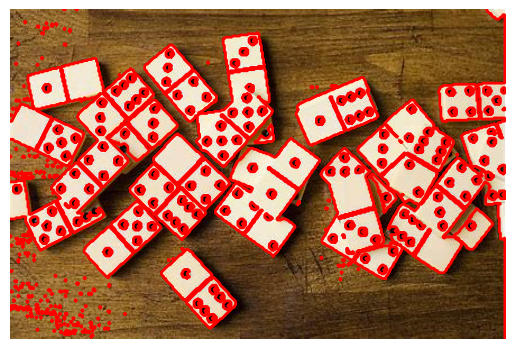

In [57]:
def plot_image_contours(image):
    fig,ax=plt.subplots()
    ax.imshow(image,cmap=plt.cm.gray)
    for contour in mark_contours(image):
        ax.plot(contour[:,1],contour[:,0],linewidth=2,color ='red')
    ax.axis("off")
plot_image_contours(domino)